# CS484 HW3

# Importing necessary libraries

In [1]:
import os
import cv2
import numpy as np
from skimage.segmentation import slic, mark_boundaries
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Functions to be used

In [2]:
def load_images(path):
    images = []  # Create an empty list to store the images
    for filename in os.listdir(path):  # Iterate over each file in the specified path
        img = cv2.imread(os.path.join(path, filename))  # Read the image using OpenCV's imread() function
        if img is not None:  # Check if the image was successfully loaded
            img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # Convert the image from RGB to BGR color space
            images.append(img)  # Append the image to the list of images
        else:
            pass  # If the image couldn't be loaded, do nothing and continue to the next file
    return images  # Return the list of loaded images


In [3]:
def gabor_filter_bank(image, num_scales=4, num_orientations=4):
    gabor_bank = []  # Create an empty list to store the filtered images
    ksize = 31  # Define the size of the Gabor kernel
    for scale in np.linspace(1, 10, num_scales, endpoint=True):  # Iterate over the specified number of scales
        for orientation in np.linspace(0, np.pi, num_orientations, endpoint=False):  # Iterate over the specified number of orientations
            # Generate a Gabor kernel using cv2.getGaborKernel()
            gabor_kernel = cv2.getGaborKernel((ksize, ksize), 4.0, orientation, scale, 1, 0, ktype=cv2.CV_32F)
            # Apply the Gabor kernel to the input image using cv2.filter2D()
            filtered_image = cv2.filter2D(image, cv2.CV_32F, gabor_kernel)
            # Compute the absolute values of the filtered image using np.abs()
            abs_image = np.abs(filtered_image)
            # Rescale the absolute image values to the range [0, 255] using normalization
            rescaled_image = (abs_image / np.max(abs_image) * 255).astype(np.uint8)
            # Append the rescaled image to the Gabor filter bank list
            gabor_bank.append(rescaled_image)
    return gabor_bank  # Return the list of filtered images

In [4]:
def average_gabor_features(superpixels, gabor_bank):
    features = []  # Create an empty list to store the average Gabor features
    for sp in np.unique(superpixels):  # Iterate over unique superpixels in the superpixels array
        mask = (superpixels == sp)  # Create a binary mask for the current superpixel
        avg_features = []  # Create an empty list to store the average features for the current superpixel
        for gabor_response in gabor_bank:  # Iterate over the Gabor filter bank
            # Resize the Gabor response to match the size of the superpixels array using cv2.resize()
            gabor_response_resized = cv2.resize(gabor_response, (superpixels.shape[1], superpixels.shape[0]))
            # Compute the average of the resized Gabor response within the current superpixel region using np.mean()
            avg_features.append(np.mean(gabor_response_resized[mask]))
        features.append(avg_features)  # Append the average features for the current superpixel to the features list
    return np.array(features)  # Return the average Gabor features as a numpy array


In [5]:
def clustering(features, num_clusters=5):
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)  # Create a KMeans clustering object with the specified number of clusters
    labels = kmeans.fit_predict(features)  # Fit the KMeans model to the features and assign cluster labels to each data point
    return labels  # Return the cluster labels

In [6]:
def apply_clustering_to_superpixels(superpixels, cluster_labels_dict):
    unique_labels = np.unique(superpixels)  # Get the unique labels in the superpixels array
    pseudocolor_image = np.zeros((*superpixels.shape, 3), dtype=np.uint8)  # Create an empty pseudocolor image with the same shape as superpixels
    for label in unique_labels:  # Iterate over the unique labels
        cluster_label = cluster_labels_dict.get(label, 0)  # Retrieve the cluster label for the current superpixel using cluster_labels_dict.get()
        pseudocolor = np.array(COLORS[cluster_label % len(COLORS)], dtype=np.uint8)  # Get the corresponding pseudocolor based on the cluster label
        mask = (superpixels == label)  # Create a mask to identify the pixels belonging to the current superpixel
        pseudocolor_image[mask] = pseudocolor  # Assign the pseudocolor to the pixels of the current superpixel in the pseudocolor image
    return pseudocolor_image  # Return the pseudocolor image

In [7]:
def find_neighbours(superpixels, centroid, radius_thresholds, pixel_threshold):
    neighbours = {1: [], 2: []}  # Create an empty dictionary to store the neighbours
    x, y = np.indices(superpixels.shape)  # Generate coordinate indices for each pixel in the superpixels array
    distance_map = np.sqrt((x - centroid[1])**2 + (y - centroid[0])**2)  # Compute the Euclidean distance of each pixel to the centroid

    radius_threshold_values = list(radius_thresholds.values())  # Extract the values of the radius thresholds from the provided dictionary
    for r1, r2 in zip(radius_threshold_values[:-1], radius_threshold_values[1:]):  # Iterate over pairs of consecutive radius thresholds
        mask = (distance_map >= r1) & (distance_map < r2)  # Create a mask to identify pixels within the current radius range
        if np.any(mask):  # Check if any pixels satisfy the mask condition
            neighbour_labels, counts = np.unique(superpixels[mask], return_counts=True)  # Find unique neighbour labels and their corresponding counts
            neighbour_labels = neighbour_labels[counts >= pixel_threshold]  # Filter neighbour labels based on the pixel count threshold
            neighbours[len(neighbours)] = list(neighbour_labels)  # Add the filtered neighbour labels to the neighbours dictionary

    return neighbours  # Return the neighbours dictionary

In [8]:
def contextual_features(superpixels, features, pixel_threshold=5):
    contextual_features_list = []  # Create an empty list to store the contextual features
    num_labels = len(np.unique(superpixels))  # Get the number of unique labels in the superpixels array

    for label in range(num_labels):  # Iterate over each label
        mask = (superpixels == label)  # Create a mask to identify the pixels belonging to the current label
        centroid = np.array(np.nonzero(mask))  # Get the centroid coordinates of the current label using the nonzero elements of the mask
        if centroid.size == 0:  # If the centroid size is zero, continue to the next label
            continue
        centroid = centroid.mean(axis=1)  # Compute the centroid coordinates as the mean along each axis

        radius_thresholds = {1: 1.5 * np.sqrt(np.sum(mask)), 2: 2.5 * np.sqrt(np.sum(mask))}  # Compute the radius thresholds based on the sum of the mask

        neighbours = find_neighbours(superpixels, centroid, radius_thresholds, pixel_threshold)  # Find the neighbors using the find_neighbours() function

        first_level_neighbours_features = np.nanmean([features[neighbour] for neighbour in neighbours[1] if neighbour < len(features)], axis=0) if neighbours[1] else np.zeros_like(features[label])  # Compute the mean of the first level neighbor features, considering the pixel threshold and ensuring valid indices
        second_level_neighbours_features = np.nanmean([features[neighbour] for neighbour in neighbours[2] if neighbour < len(features)], axis=0) if neighbours[2] else np.zeros_like(features[label])  # Compute the mean of the second level neighbor features, considering the pixel threshold and ensuring valid indices

        concatenated_features = np.hstack([features[label], first_level_neighbours_features, second_level_neighbours_features])  # Concatenate the features of the current label with the first and second level neighbor features
        contextual_features_list.append(concatenated_features)  # Append the concatenated features to the contextual_features_list

    return np.array(contextual_features_list)  # Return the contextual features as a numpy array

# Loading images

In [9]:
image_path = './CS484_HW3/'
images = load_images(image_path)

In [10]:
len(images)

10

# Displaying original images

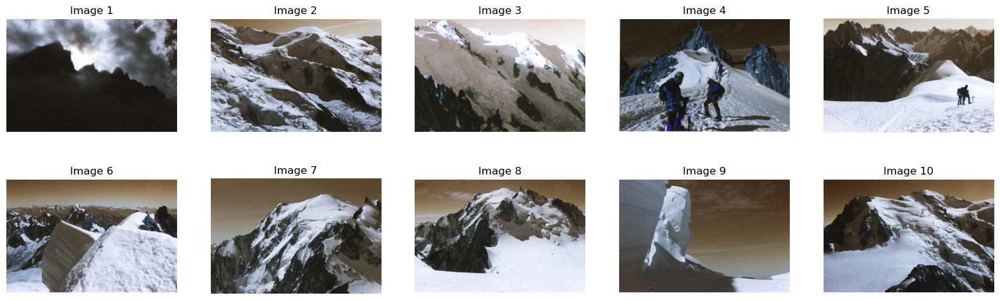

In [11]:
fig, axes = plt.subplots(2, 5, figsize=(20, 6))

for i, image in enumerate(images):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')
    axes[row, col].set_title(f"Image {i+1}")

plt.show()

# Part 1 Displaying with superpixels

In [12]:
n_segments = 300
compactness = 25

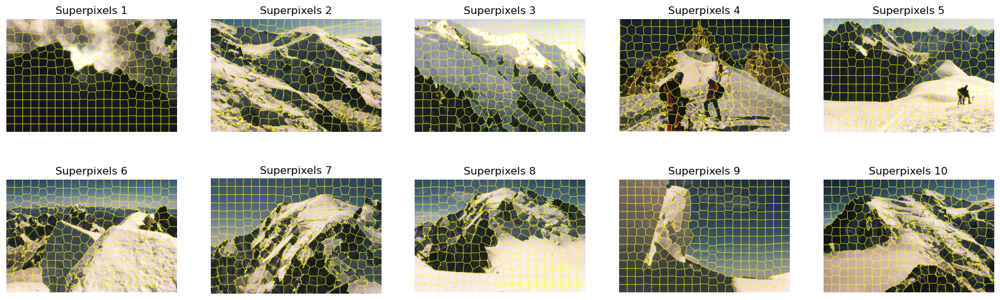

In [13]:
superpixel_arrays = []

fig, axes = plt.subplots(2, 5, figsize=(20, 6))

for i, image in enumerate(images):
    # Part 1: Obtain an over-segmentation for each image
    superpixels = slic(image, n_segments=n_segments, compactness=compactness)
    superpixel_arrays.append(superpixels)
    
    # Display the superpixels
    row = i // 5
    col = i % 5
    axes[row, col].imshow(mark_boundaries(image, superpixels))
    axes[row, col].axis('off')
    axes[row, col].set_title(f"Superpixels {i+1}")

plt.show()

# Part 2 Displaying Gabor filter features

In [14]:
num_scales = 4
num_orientations = 4

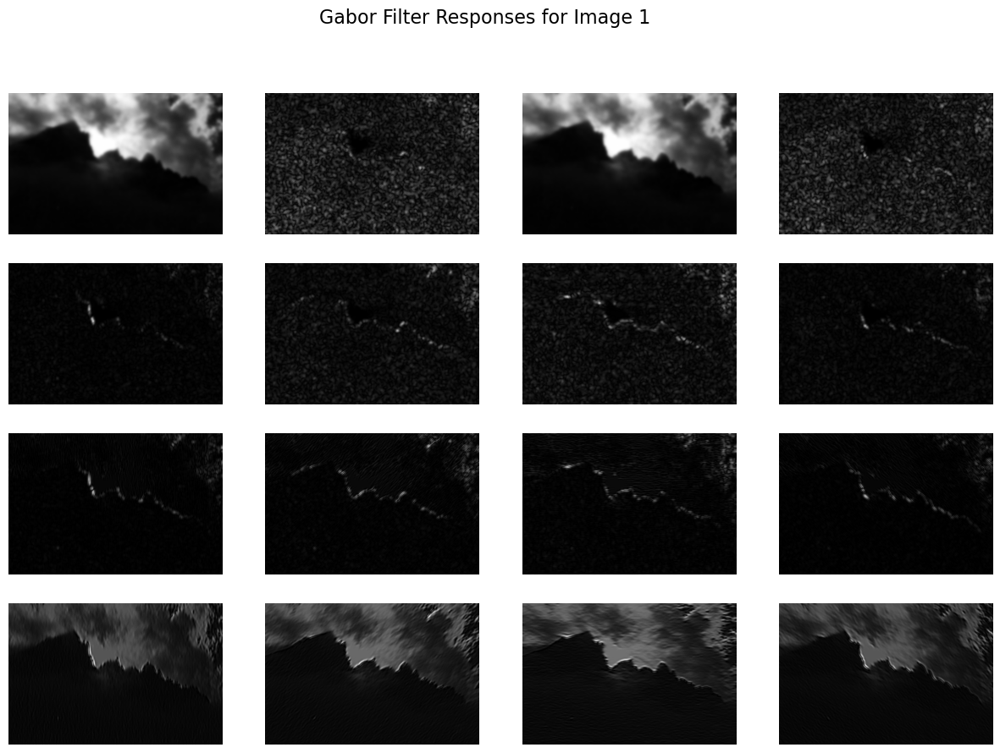

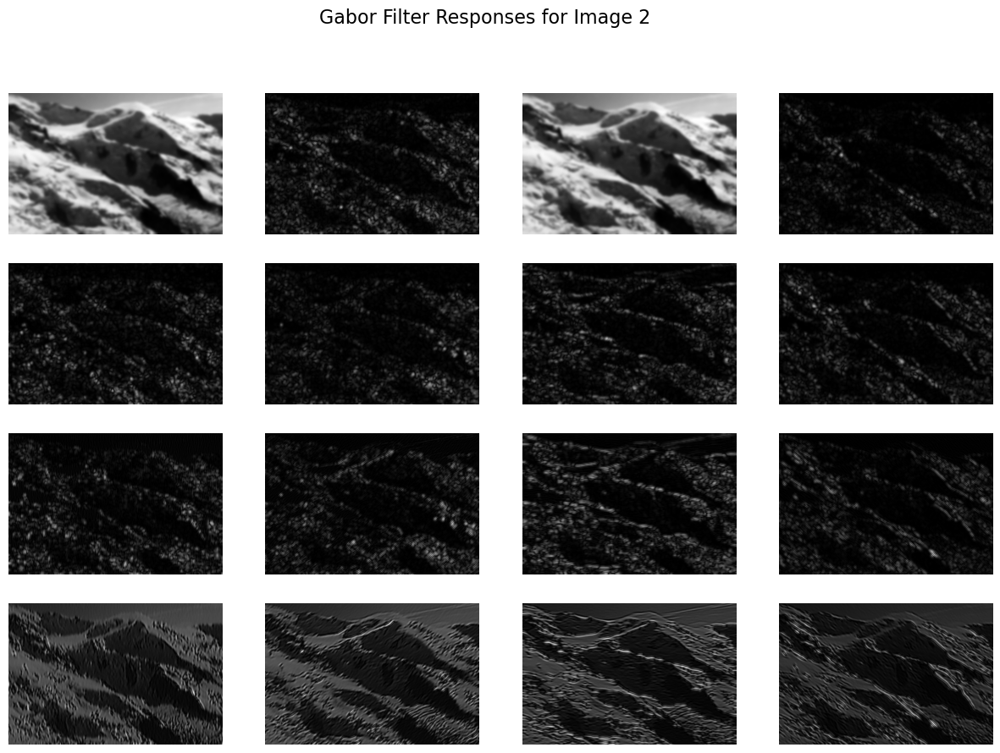

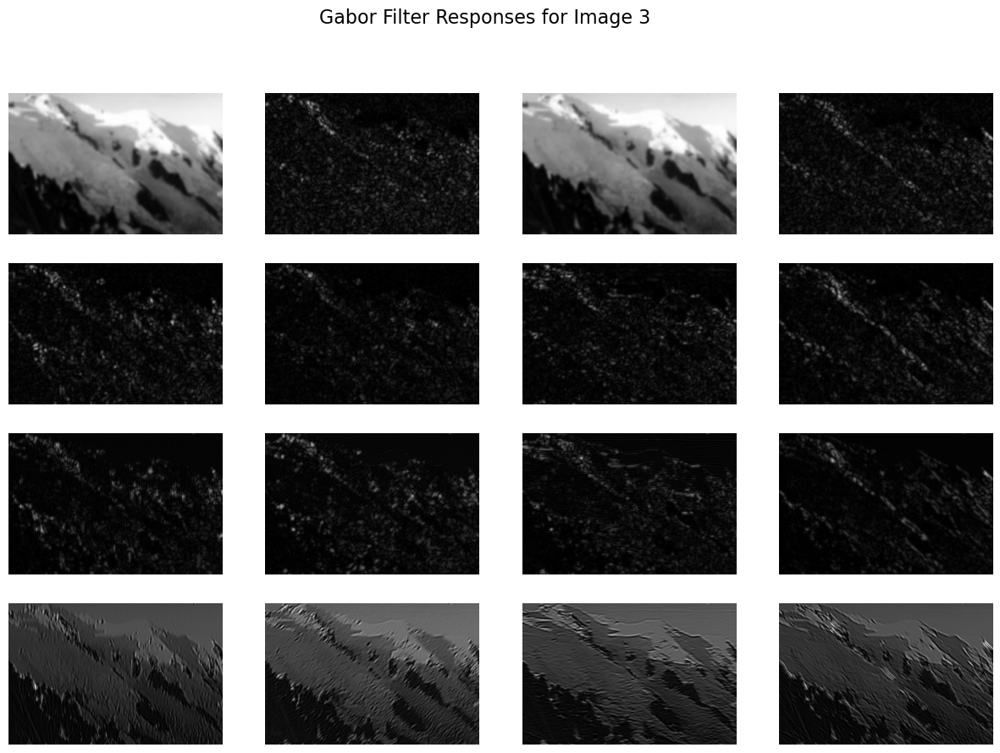

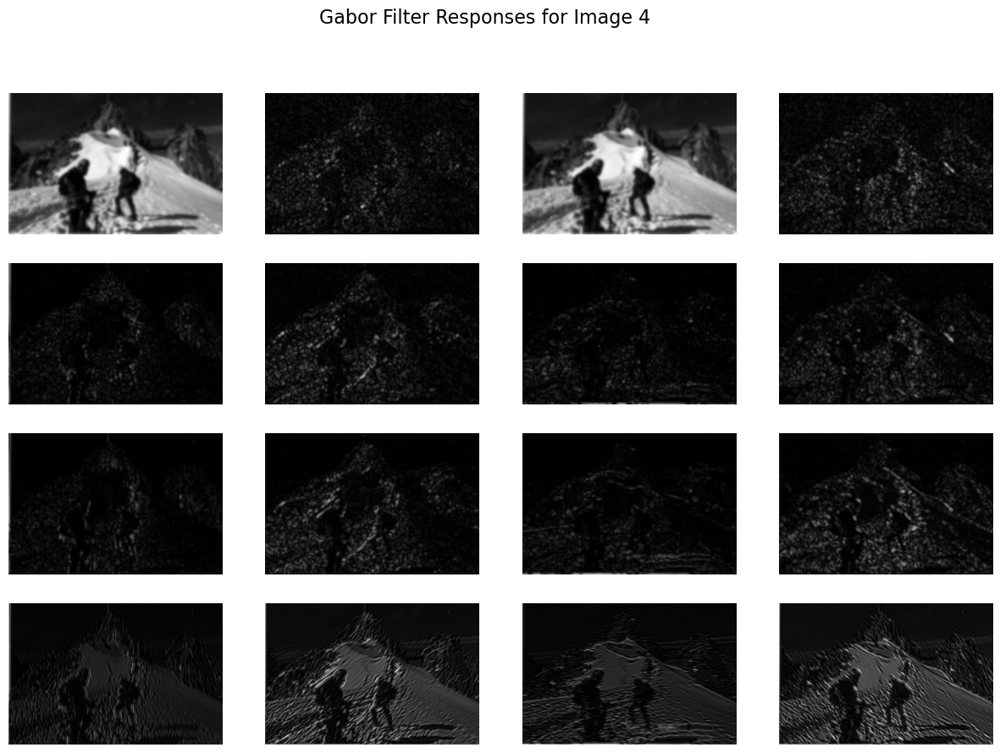

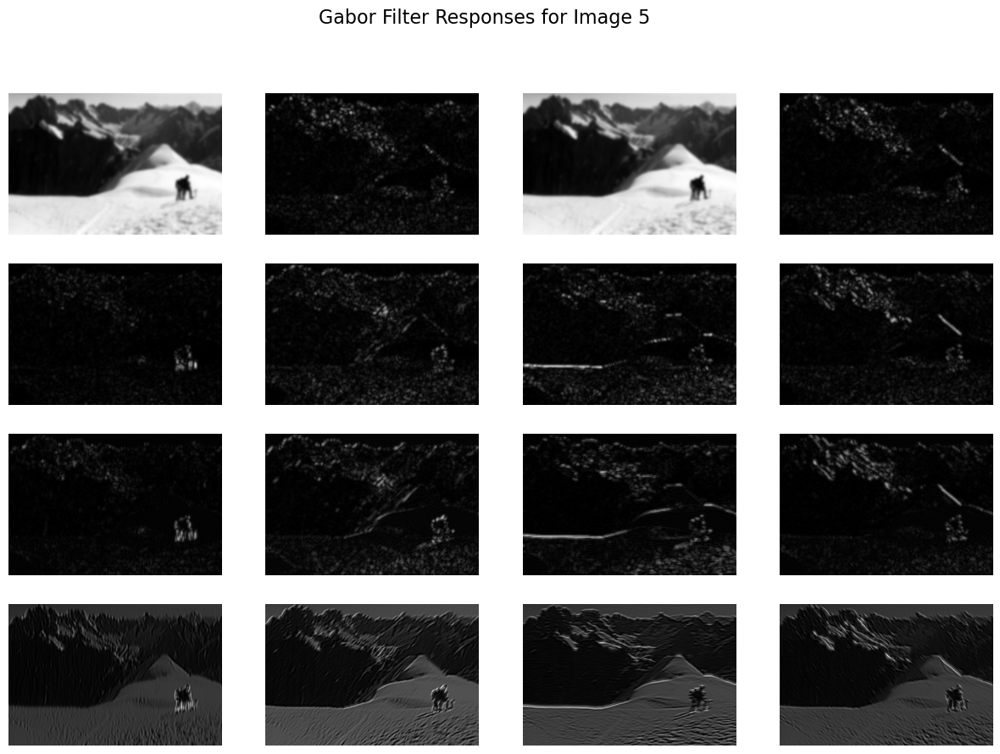

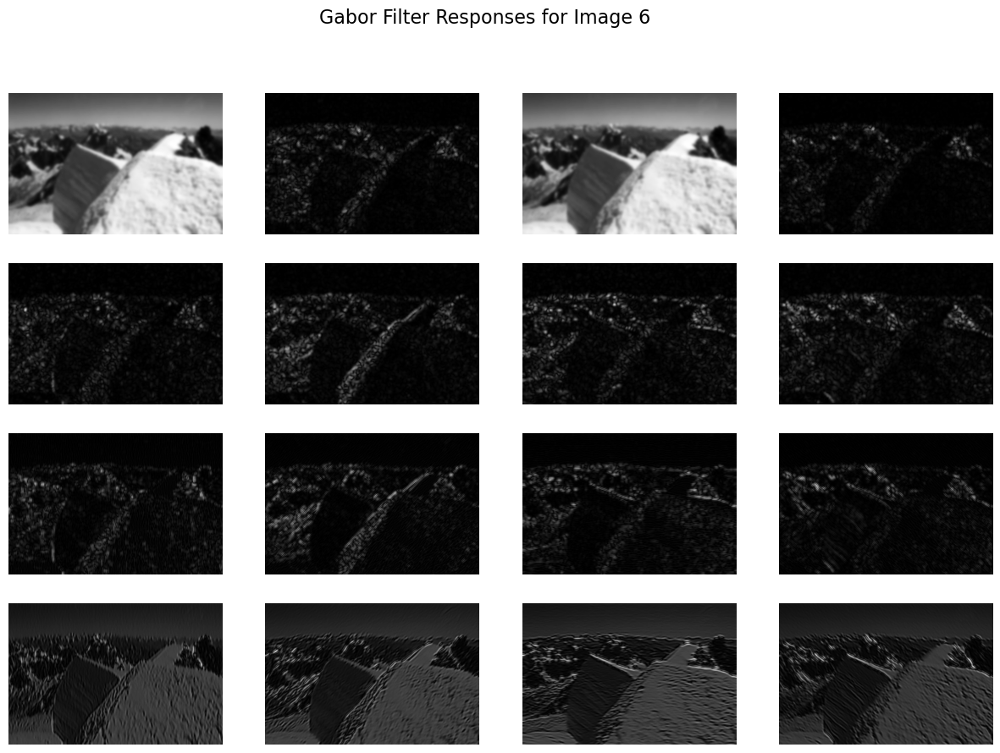

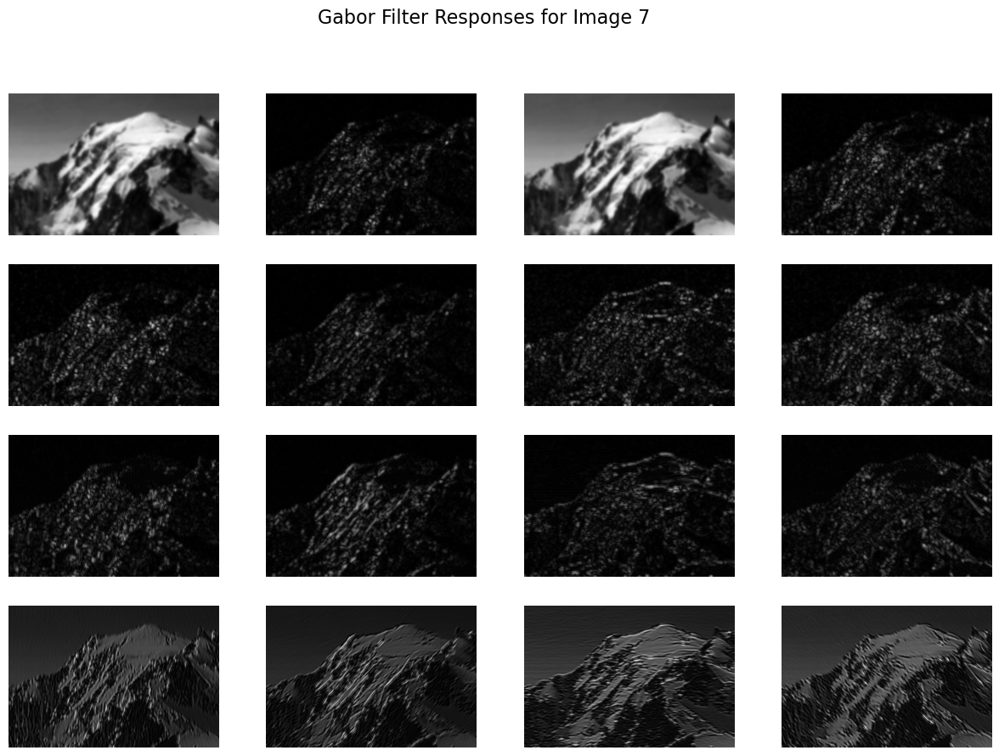

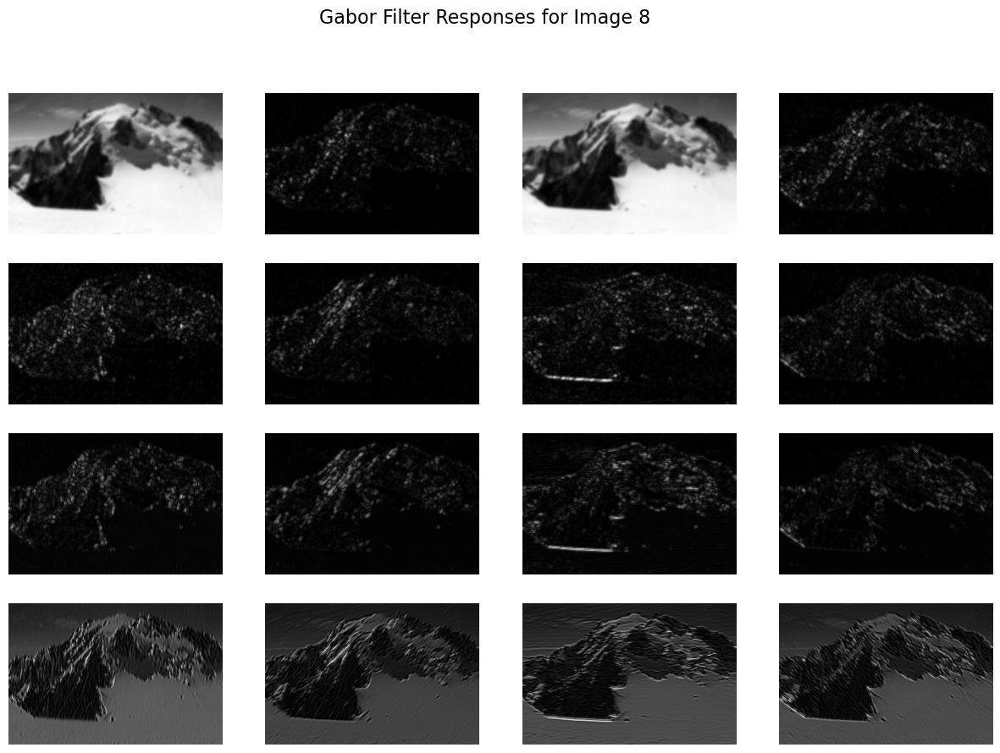

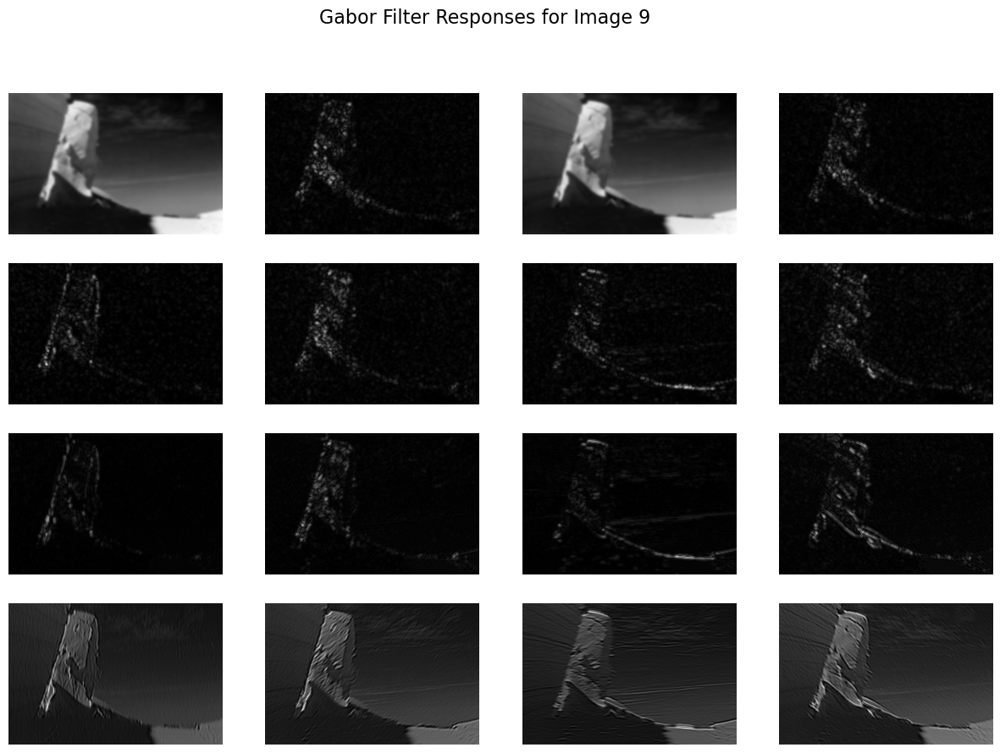

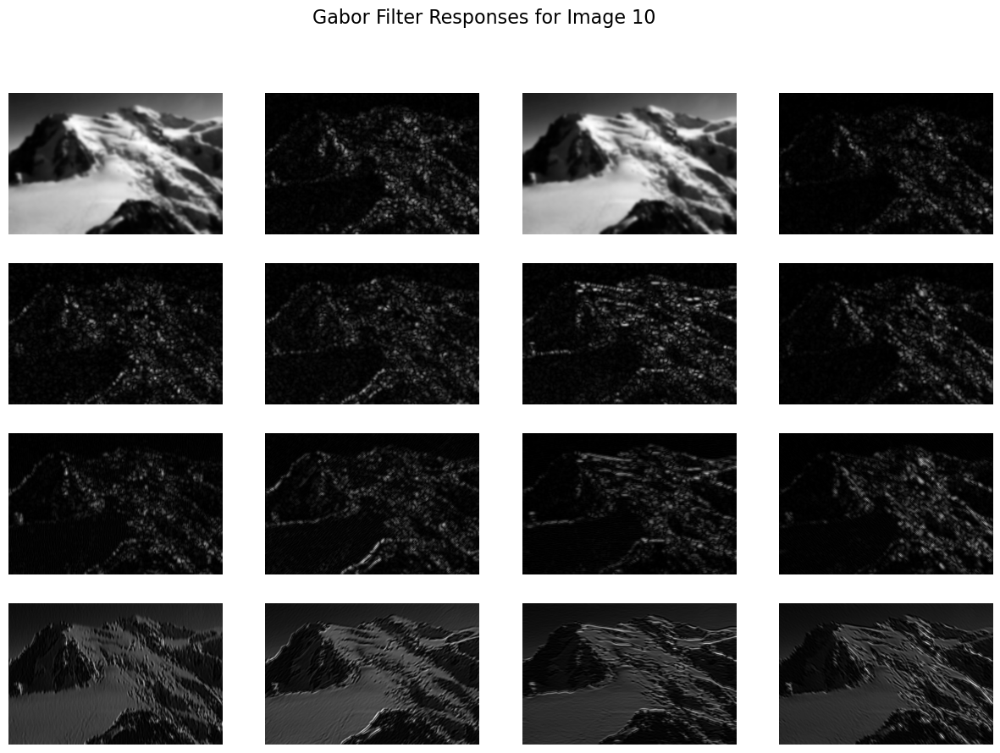

In [15]:
# Initialize a list to store the feature matrices for all images
feature_matrices = []

# Loop over all images
for i, image in enumerate(images):
    fig, axes = plt.subplots(num_scales, num_orientations, figsize=(15, 10))

    # Add a title to the entire figure
    fig.suptitle(f'Gabor Filter Responses for Image {i+1}', fontsize=16)

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gabor_bank = gabor_filter_bank(gray_image, num_scales=num_scales, num_orientations=num_orientations)
    
    # Obtain the superpixels for the current image
    superpixels = superpixel_arrays[i]
    
    # Compute the average Gabor features for each superpixel
    avg_gabor_features = average_gabor_features(superpixels, gabor_bank)
    
    for j in range(num_scales):
        for k in range(num_orientations):
            ax = axes[j, k]
            ax.imshow(gabor_bank[j * num_orientations + k], cmap='gray')
            ax.axis('off')

    plt.show()
    
    # Append the feature matrix for the current image to the list
    feature_matrices.append(avg_gabor_features)

# print(len(feature_matrices))

# Part 3 Clustering and Segmentation

In [16]:
COLORS = [
    (255, 179, 186),  # Pastel red
    (255, 223, 186),  # Pastel orange
    (255, 255, 186),  # Pastel yellow
    (186, 255, 201),  # Pastel green
    (186, 225, 255),  # Pastel blue
    (204, 186, 255),  # Pastel purple
    (255, 186, 255),  # Pastel pink
    (255, 218, 193),  # Pastel peach
    (220, 255, 186),  # Pastel lime
    (186, 255, 255),  # Pastel cyan
    (255, 186, 225),  # Pastel magenta
    (255, 203, 186),  # Pastel salmon
    (186, 255, 232)   # Pastel mint
]

In [17]:
# Define the variables
n_segments = 300
compactness = 25
num_clusters = 4

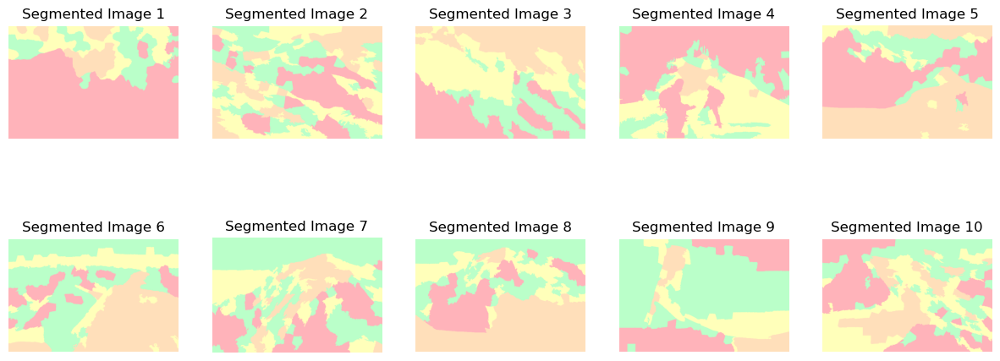

In [18]:
# Compute the features for all superpixels of all images
all_features = []
all_superpixels = []
for i, image in enumerate(images):
    # Part 1: Obtain an over-segmentation for each image
    superpixels = slic(image, n_segments=n_segments, compactness=compactness)
    all_superpixels.append(superpixels)
    
    # Part 2: Compute Gabor texture features for all images
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gabor_bank = gabor_filter_bank(gray_image)
    features = average_gabor_features(superpixels, gabor_bank)
    all_features.append(features)

# Flatten the list of features
all_features = np.concatenate(all_features)

# Apply the clustering algorithm to all features
cluster_labels = clustering(all_features, num_clusters=num_clusters)

# Set up the grid for displaying the images
n_images = len(images)
n_rows = n_images // 5 + int(n_images % 5 > 0)
n_cols = 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))

# Map the cluster labels back to the superpixels of each image
start = 0
for i, image in enumerate(images):
    superpixels = all_superpixels[i]
    end = start + len(np.unique(superpixels))
    cluster_labels_dict = {label: cluster_label for label, cluster_label in zip(np.unique(superpixels), cluster_labels[start:end])}
    start = end

    # Create a segmented image using clustering results
    segmented_image = apply_clustering_to_superpixels(superpixels, cluster_labels_dict)

    # Display the segmented image (this is the pseudo-color image)
    row = i // 5
    col = i % 5
    axes[row, col].imshow(segmented_image)
    axes[row, col].axis('off')
    axes[row, col].set_title(f"Segmented Image {i+1}")

# Remove unused subplots (if any)
for j in range(i+1, n_rows*n_cols):
    row = j // 5
    col = j % 5
    axes[row, col].axis('off')

plt.show()

# Part 4 Contextual Representation and Clustering

In [81]:
# Define the variables
n_segments = 50
compactness = 23
num_clusters = 4
pixel_threshold = 1

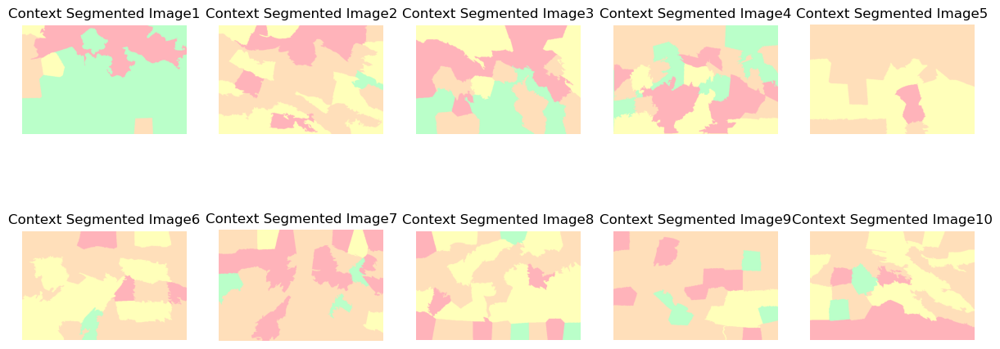

In [82]:
# Compute the features for all superpixels of all images
all_features = []
all_superpixels = []
for i, image in enumerate(images):
    # Part 1: Obtain an over-segmentation for each image
    superpixels = slic(image, n_segments=n_segments, compactness=compactness)
    all_superpixels.append(superpixels)
    
    # Part 2: Compute Gabor texture features for all images
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gabor_bank = gabor_filter_bank(gray_image)
    features = average_gabor_features(superpixels, gabor_bank)
    
    # Part 4: Build a contextual representation for each superpixel
    context_features = contextual_features(superpixels, features, pixel_threshold=pixel_threshold)
    all_features.append(context_features)

# Flatten the list of features
all_features = np.concatenate(all_features)

# Apply the clustering algorithm to all features
cluster_labels = clustering(all_features, num_clusters=num_clusters)

# Set up the grid for displaying the images
n_images = len(images)
n_rows = n_images // 5 + int(n_images % 5 > 0)
n_cols = 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))

# Map the cluster labels back to the superpixels of each image
start = 0
for i, image in enumerate(images):
    superpixels = all_superpixels[i]
    end = start + len(np.unique(superpixels))
    cluster_labels_dict = {label: cluster_label for label, cluster_label in zip(np.unique(superpixels), cluster_labels[start:end])}
    start = end

    # Create a segmented image using clustering results
    segmented_image = apply_clustering_to_superpixels(superpixels, cluster_labels_dict)

    # Display the segmented image
    row = i // 5
    col = i % 5
    axes[row, col].imshow(segmented_image)
    axes[row, col].axis('off')
    axes[row, col].set_title(f"Context Segmented Image{i+1}")

# Remove unused subplots (if any)
for j in range(i+1, n_rows*n_cols):
    row = j // 5
    col = j % 5
    axes[row, col].axis('off')

plt.show()